# Fuel Consumption project

### Table of Contents

1. [Dataset Description](#fuel)
2. [Importing the packages and dataset](#packages)
3. [Exploring the dataset](#explore)
4. [Checking for null values](#null)
5. [Data Visualizations](#dv)
6. [Label Encoding](#le)
7. [Splitting](#ss)
8. [Linear Regression before Model Explainability](#lrbme)
9. [Model Explainability for Linear Regression](#me)
     - 9.1 [ELI5](#el)
     - 9.2 [LIME](#li)
     - 9.3 [SHAP](#sh)
10. [Linear Regression after Model Explainability](#lrame)
11. [Decision Tree before Model Explainability](#dtbme)
12. [Model Explainability for Decision Tree](#dtme)
     - 12.1 [ELI5](#eldt)
     - 12.2 [LIME](#lidt)
     - 12.3 [SHAP](#shdt)
13. [Decision Tree after Model Explainability](#dtame)
14. [Random Forest before Model Explainability](#rfbme)
15. [Model Explainablity for Random Forest](#rfme)
    - 15.1 [ELI5](#elrf)
    - 15.2 [LIME](#lirf)
    - 15.3 [SHAP](#shrf)
16. [Random Forest after Model Explainability](#rfame)
17. [Support Vector Machine before Model Explainability](#svbme)
18. [Model Explainability for Support Vector Machine](#svme)
    - 18.1 [ELI5](#elsv)
    - 18.2 [LIME](#lisv)
    - 18.3 [SHAP](#shsv)
19. [Support Vector Machine after Model Explainability](#svame)
20. [KNearest Neighbor before Model Explainability](#knnbme)
21. [Model Explainability for KNearest Neighbor](#knnme)
    - 21.1 [ELI5](#elknn)
    - 21.2 [LIME](#liknn)
    - 21.3 [SHAP](#shknn)
22. [KNearest Neighbor after Model Explainability](#knname)
23. [XG Boost before Model Explainability](#xgbme)
24. [Model Explainability for XG Boost](#xgme)
    - 24.1 [ELI5](#elxg)
    - 24.2 [SHAP](#shxg)
25. [XG Boost after Model Explainability](#xgame)
26. [Ada Boost before Model Explainability](#adabme)
27. [Model Explainability for Ada Boost](#adame)
    - 27.1 [ELI5](#elada)
    - 27.2 [LIME](#liada)
    - 27.3 [SHAP](#shada)
28. [Ada Boost after Model Explainability](#adaame)
29. [Gradient Boosting before Model Explainability](#gradbme)
30. [Model Explainability for Gradient Boosting](#gradme)
    - 30.1 [ELI5](#elgrad)
    - 30.2 [LIME](#ligrad)
    - 30.3 [SHAP](#shgrad)
31. [Gradient Boosting after Model Explainability](#gradame)
32. [Comparison Table](#ct)

# Fuel Consumption dataset


### 1. Dataset Description  <a id='fuel'>
**Objective**
Our objective is to predict the fuel consumption so that we can economize the fuel consumption

Columns

1.Payload-Describes the loaded cargo.

2.Reliability-Probability of this route to be on time according to historical data.

3.Season-Describes the weather condition. 0 is good weather and 1 is bad weather

4.Net-This is a discrete quantitative variable that describes the quality of the roadnet. 1 is bad quality, 2 is mediocre and 3 is good quality

5.Fuel-The dependent variable. It is describing the fuel consumption of a truck when doing this route

6.LoadValue-This is the value of the cargo of the truck.

7.TransmissionType-Truck can have automatic or manual transmission.

### 2. Importing packages and dataset <a id='packages'>

In [1]:
# Importing the libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Reading the dataset
fuel = pd.read_csv('kaggle.csv')

### 3. Exploring the dataset  <a id='explore'>

In [3]:
# Head of the dataset
fuel.head()

,Unnamed: 0,Payload,Reliability,Season,Net,Fuel,LoadValue,TransmissionType
0,0,268.003362,88.942169,0,3,13.033955,1130.150394,automatic
1,1,270.695677,86.018913,0,3,12.843801,1137.342936,manual
2,2,268.346849,85.945960,0,3,12.500423,1319.950261,automatic
3,3,253.712697,87.986605,0,3,11.987058,1662.979622,automatic
4,4,240.949546,83.871310,0,3,12.248381,1674.107415,manual


In [4]:
# Removing the Unnamed: 0 column
fuel = fuel.drop('Unnamed: 0',1)

In [5]:
# Shape of the dataset
fuel.shape

(4493, 7)

In [6]:
# Info of the dataset
fuel.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4493 entries, 0 to 4492
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Payload           4493 non-null   float64
 1   Reliability       4493 non-null   float64
 2   Season            4493 non-null   int64  
 3   Net               4493 non-null   int64  
 4   Fuel              4493 non-null   float64
 5   LoadValue         4493 non-null   float64
 6   TransmissionType  4493 non-null   object 
dtypes: float64(4), int64(2), object(1)
memory usage: 245.8+ KB


**Descriptive Statistics**

In [7]:
# Summary statistics
fuel.describe()

,Payload,Reliability,Season,Net,Fuel,LoadValue
count,4493.000000,4493.000000,4493.000000,4493.000000,4493.000000,4493.000000
mean,284.053496,70.184271,0.146227,2.380147,16.508160,854.382437
std,12.344016,6.665746,0.353373,0.557214,1.846029,249.432115
min,228.025383,48.145788,0.000000,1.000000,11.298344,152.690191
25%,276.898803,65.418693,0.000000,2.000000,15.169328,674.397696
50%,286.560013,70.238216,0.000000,2.000000,16.442109,830.769184
75%,293.842742,74.921809,0.000000,3.000000,17.773924,1010.278817
max,299.999307,90.315143,1.000000,3.000000,23.335635,1967.946647


**As we could see the max and min are almost same for all the columns so no need of scaling**

### 4. Checking for null values  <a id='null'>

In [8]:
# Null values check
fuel.isnull().sum()

Payload             0
Reliability         0
Season              0
Net                 0
Fuel                0
LoadValue           0
TransmissionType    0
dtype: int64

**We could see that there are no null values present in the dataset**

### 5. Data Visualizations  <a id='dv'>

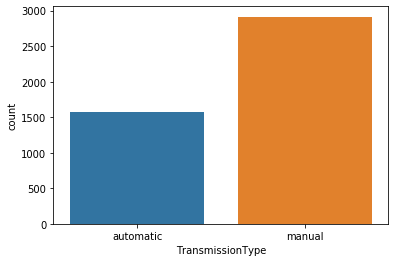

In [9]:
# Countplot for Transmission Type
sns.countplot(x='TransmissionType',data=fuel)

**We could see there are more cars of the Transmission Type manual this may be due to the cost difference between them**

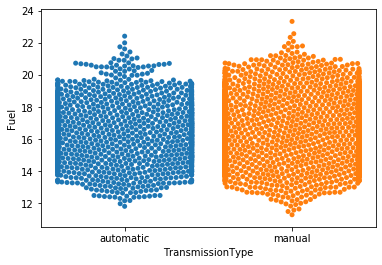

In [10]:
# Swarmplot for Transmission Type vs Fuel
sns.swarmplot(x='TransmissionType',y='Fuel',data=fuel)

**We could see that the fuel consumption is almost same for both the Transmission Type so fuel consumption is not dependent on Transmission Type**

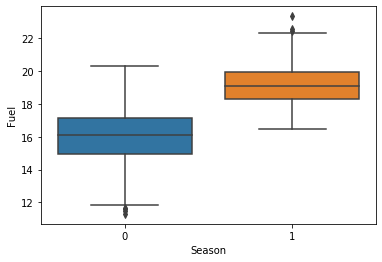

In [11]:
# Boxplot for Season vs Fuel
sns.boxplot(x='Season',y='Fuel',data=fuel)


**We could see that most of the fuel consumption happened when the weather is good although even some happened during when weather is bad this may be due to some uncontrollable circumstances**

Lets check if Reliability has any effect on weather conditions

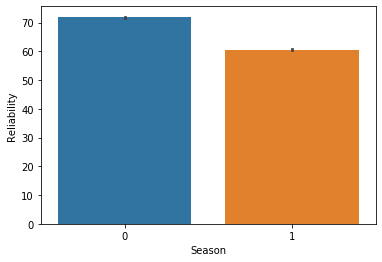

In [12]:
# Barplot for Season vs Reliability
sns.barplot(x='Season',y='Reliability',data=fuel)

**Well we could see that the Reliability is less for when weather condition is bad so there have been delays in reaching the destination**

Lets check how Fuel Consumption related to Reliability

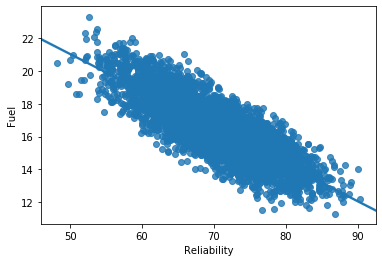

In [13]:
# Regression plot for Reliability vs Fuel
sns.regplot(x='Reliability',y='Fuel',data=fuel)

**We coul see Fuel and Reliability are in a negative linear relationship with each other so with increase in fuel consumption the reliability decreases which means if people try to keep up their travel time on track then there is chance of fuel consumption to be reduced**

Lets check if there is relationship between fuel consumption and roadnet quality

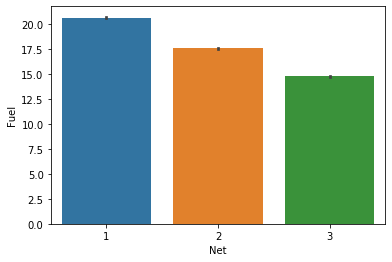

In [14]:
# Barplot for Net vs Fuel
sns.barplot(x='Net',y='Fuel',data=fuel)

**We could see a decreasing trend so with increase in quality the fuel consumption gets reduced (ie) the more the good quality the less the fuel consumption**

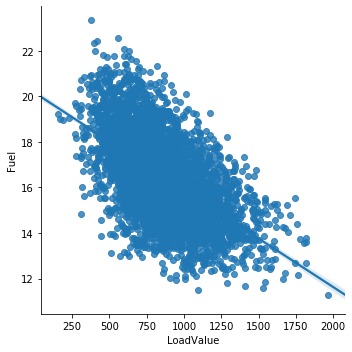

In [15]:
# Linear Regression plot for Load Value vs Fuel
sns.lmplot(x='LoadValue',y='Fuel',data=fuel)

**We could see that with increase in LoadValue the Fuel consumption decreases this may be due to the increased weight in the truck,as weight is very much more the speed of the truck decreases thereby fuel consumption also reduces**

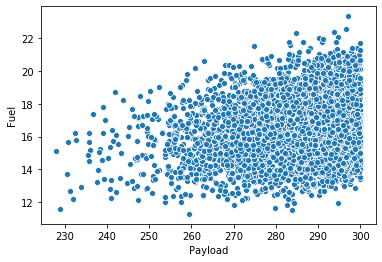

In [16]:
# Scatterplot for Payload vs Fuel
sns.scatterplot(x='Payload',y='Fuel',data=fuel)

**We could see that with increase in Payload the Fuel consumption also increases but stops at a point**

### 6. Label Encoding  <a id='le'>

In [17]:
# Label encoding the Transmission Type
fuel['TransmissionType'] = fuel['TransmissionType'].map({'manual':0,'automatic':1})

### 7. Splitting  <a id='ss'>

In [18]:
# Assigning x and y variables
x = fuel.drop('Fuel',1)
y = fuel['Fuel']

In [19]:
# Importing train test split and splitting the dataset
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.25,random_state=2)

### 8. Linear Regression before Model Explainability<a id='lrbme'>

In [20]:
# Importing Linear Regression and fitting the model
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(x_train,y_train)
lr_pred = lr.predict(x_test)

In [21]:
# Importing metrics and evaluating the model
from sklearn import metrics

In [22]:
# RMSE score 
lr_rmse = np.sqrt(metrics.mean_squared_error(lr_pred,y_test))
lr_rmse

0.7439800555211273

In [23]:
# R2 score
lr_r2score = metrics.r2_score(lr_pred,y_test)
lr_r2score

0.8069903295246744

In [24]:
# Train score
lr_train = lr.score(x_train,y_train)
lr_train

0.8338348615004628

In [25]:
# Test score
lr_test = lr.score(x_test,y_test)
lr_test

0.8363680910278398

### 9. Model Explainability  for Linear Regression<a id = 'me'>

### 9.1 ELI5 <a id = 'el'>

In [26]:
pip install eli5

Note: you may need to restart the kernel to use updated packages.


In [27]:
# Import Eli5 package
import eli5
from eli5.sklearn import PermutationImportance

# Find the importance of columns for prediction
perm = PermutationImportance(lr, random_state=1).fit(x_test,lr_pred)
eli5.show_weights(perm, feature_names = x_test.columns.tolist())

Weight,Feature
0.7390 ± 0.0439,Net
0.2867 ± 0.0090,Reliability
0.0331 ± 0.0013,Season
0.0011 ± 0.0001,Payload
0.0001 ± 0.0000,LoadValue
0.0000 ± 0.0000,TransmissionType


In [28]:
ind = 4
#Understanding how each feature influences the prediction
eli5.explain_prediction(lr,x_test.iloc[30])

Explanation(estimator='LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)', description=None, error=None, method='linear model', is_regression=True, targets=[TargetExplanation(target='y', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=26.66152645251956, std=None, value=1.0), FeatureWeight(feature='Payload', weight=0.8381685833762963, std=None, value=256.3497170996445)], neg=[FeatureWeight(feature='Reliability', weight=-6.803294903145927, std=None, value=70.53726673788535), FeatureWeight(feature='Net', weight=-3.6572182808968763, std=None, value=2.0), FeatureWeight(feature='LoadValue', weight=-0.04129360683807951, std=None, value=889.7879850266589)], pos_remaining=0, neg_remaining=0), proba=None, score=16.997888245014973, weighted_spans=None, heatmap=None)], feature_importances=None, decision_tree=None, highlight_spaces=None, transition_features=None, image=None)

### 9.2 LIME <a id = 'li'>

In [29]:
# Import lime package
import lime
import lime.lime_tabular

#Find caegorical features
categorical_features = np.argwhere(np.array([len(set(x_test.values[:,x])) for x in range(x_test.values.shape[1])]) <= 10).flatten()
#Lime explainer for regression
explainer = lime.lime_tabular.LimeTabularExplainer(x_test.values,
                    feature_names=x_test.columns.values.tolist(),
                    class_names=['PriceCrore'],
                    categorical_features=categorical_features,
                    verbose=True, mode='regression')

ind = 4
#Fit on test data
exp = explainer.explain_instance(x_test.values[ind],lr.predict, num_features=6)

#Show in notebook features influencing predictions
exp.show_in_notebook(show_table=True)

Intercept 18.092917524888602
Prediction_local [14.37601041]
Right: 14.030022682764937


### 9.3 SHAP <a id = 'sh'>

In [30]:
pip install shap

Note: you may need to restart the kernel to use updated packages.


In [31]:
#Import SHAP package
import shap

#Create explainer for linear model
explainer = shap.LinearExplainer(lr,data=x_test.values)
shap_values = explainer.shap_values(x_test)

In [32]:
#Understanding how each feature influences the prediction

shap.initjs()


shap.force_plot(
    explainer.expected_value, shap_values[ind,:], x_test.iloc[ind,:],
    feature_names=x_test.columns.tolist()
)

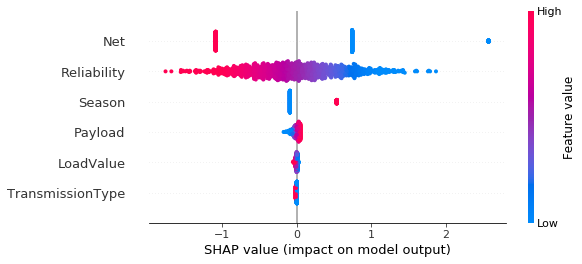

In [33]:
shap.summary_plot(shap_values,x_test)


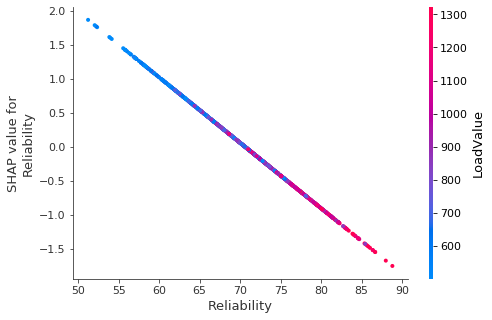

In [34]:
shap.dependence_plot("Reliability", shap_values, x_test)

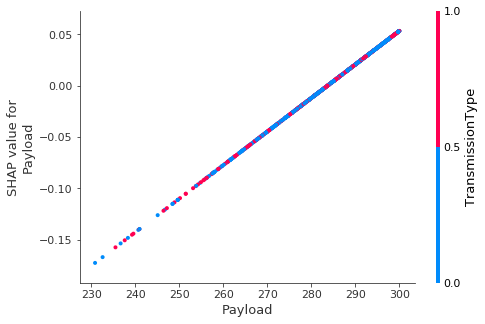

In [35]:
shap.dependence_plot("Payload", shap_values, x_test)

**We could see Net,Reliability and Season  are the columns which have most influence on the model**

### 10. Linear Regression after Model Explainability<a id='lrame'>

In [36]:
# Indexing to get the important columns
fuel_index = fuel[['Net','Reliability','Season','Fuel']]
fuel_index

,Net,Reliability,Season,Fuel
0,3,88.942169,0,13.033955
1,3,86.018913,0,12.843801
2,3,85.945960,0,12.500423
3,3,87.986605,0,11.987058
4,3,83.871310,0,12.248381
...,...,...,...,...
4488,1,48.145788,1,20.499798
4489,1,52.040528,1,22.343000
4490,1,53.786202,1,21.203045
4491,1,53.788311,1,21.763259


In [37]:
# Assigning x and y parameters
x1 = fuel_index.drop('Fuel',1)
y1 = fuel_index['Fuel']

In [38]:
# Splitting the dataset
x1_train,x1_test,y1_train,y1_test = train_test_split(x1,y1,random_state=2,test_size=0.25)

In [39]:
# Fitting the model
lrme = LinearRegression()

In [40]:
# Training the model
lrme.fit(x1_train,y1_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [42]:
# Testing the model
lrme_pred = lrme.predict(x1_test)

In [45]:
# RMSE score for the model
lrme_rmse = np.sqrt(metrics.mean_squared_error(lrme_pred,y1_test))
lrme_rmse

0.7465566549065163

In [46]:
# R2 score for the model
lrme_r2score = metrics.r2_score(lrme_pred,y_test)
lrme_r2score

0.8055566768274309

In [47]:
# Train score for the model
lrme_train = lrme.score(x1_train,y1_train)
lrme_train

0.8333233262880115

In [48]:
# Test score for the model
lrme_test = lrme.score(x1_test,y1_test)
lrme_test

0.8352327273765028

### 11. Decision Tree before Model Explainability    <a id = 'dtbme'>

In [49]:
# Importing Decision Tree and fitting the model
from sklearn.tree import DecisionTreeRegressor
dt = DecisionTreeRegressor()
dt.fit(x_train,y_train)
dt_pred = dt.predict(x_test)

In [50]:
# RMSE score for Decision Tree
dt_rmse = np.sqrt(metrics.mean_squared_error(dt_pred,y_test))
dt_rmse

1.039794347979658

In [51]:
# R2 score for Decision Tree
dt_r2score = metrics.r2_score(dt_pred,y_test)
dt_r2score

0.6925145464267682

In [52]:
# Train score for Decision Tree
dt_train = dt.score(x_train,y_train)
dt_train

0.9999999999855667

In [53]:
# Test score for Decision Tree
dt_test = dt.score(x_test,y_test)
dt_test

0.6803753132616911

### 12. Model Explainability for Decision Tree    <a id = 'dtme'>

### 12.1 ELI5     <a id = 'eldt'>

In [54]:
# Import Eli5 package
import eli5
from eli5.sklearn import PermutationImportance

# Find the importance of columns for prediction
perm = PermutationImportance(dt, random_state=1).fit(x_test,dt_pred)
eli5.show_weights(perm, feature_names = x_test.columns.tolist())

Weight,Feature
0.8631 ± 0.0604,Net
0.4150 ± 0.0125,Reliability
0.2212 ± 0.0123,LoadValue
0.2133 ± 0.0085,Payload
0.1585 ± 0.0318,Season
0.0292 ± 0.0068,TransmissionType


**We could see almost all the columns are influencing**

In [55]:
ind = 4
#Understanding how each feature influences the prediction
eli5.explain_prediction(dt,x_test.iloc[30])

Explanation(estimator="DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,\n                      max_leaf_nodes=None, min_impurity_decrease=0.0,\n                      min_impurity_split=None, min_samples_leaf=1,\n                      min_samples_split=2, min_weight_fraction_leaf=0.0,\n                      presort=False, random_state=None, splitter='best')", description='\nFeatures with largest coefficients.\n\nFeature weights are calculated by following decision paths in trees\nof an ensemble (or a single tree for DecisionTreeClassifier).\nEach node of the tree has an output score, and contribution of a feature\non the decision path is how much the score changes from parent to child.\nWeights of all features sum to the output score or proba of the estimator.\n\nCaveats:\n1. Feature weights just show if the feature contributed positively or\n   negatively to the final score, and does not show how increasing or\n   decreasing the feature value will change the prediction.\n2. In some cases, feature weight can be close to zero for an important feature.\n   For example, in a single tree that computes XOR function, the feature at the\n   top of the tree will have zero weight because expected scores for both\n   branches are equal, so decision at the top feature does not change the\n   expected score. For an ensemble predicting XOR functions it might not be\n   a problem, but it is not reliable if most trees happen to choose the same\n   feature at the top.\n', error=None, method='decision path', is_regression=True, targets=[TargetExplanation(target='y', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=16.54806090266389, std=None, value=1.0), FeatureWeight(feature='Net', weight=1.2227261938885938, std=None, value=2.0), FeatureWeight(feature='LoadValue', weight=0.14662508700602217, std=None, value=889.7879850266589)], neg=[FeatureWeight(feature='Season', weight=-0.46503766031142035, std=None, value=0.0), FeatureWeight(feature='Payload', weight=-0.3053923020771059, std=None, value=256.3497170996445), FeatureWeight(feature='TransmissionType', weight=-0.174764369221883, std=None, value=0.0), FeatureWeight(feature='Reliability', weight=-0.035079019036846404, std=None, value=70.53726673788535)], pos_remaining=0, neg_remaining=0), proba=None, score=16.937138832911252, weighted_spans=None, heatmap=None)], feature_importances=None, decision_tree=None, highlight_spaces=None, transition_features=None, image=None)

**The columns Net and LoadValue are most influencing**

### 12.2 LIME     <a id = 'lidt'>

In [56]:
# Import lime package
import lime
import lime.lime_tabular

#Find caegorical features
categorical_features = np.argwhere(np.array([len(set(x_test.values[:,x])) for x in range(x_test.values.shape[1])]) <= 10).flatten()
#Lime explainer for regression
explainer = lime.lime_tabular.LimeTabularExplainer(x_test.values,
                    feature_names=x_test.columns.values.tolist(),
                    class_names=['PriceCrore'],
                    categorical_features=categorical_features,
                    verbose=True, mode='regression')

ind = 4
#Fit on test data
exp = explainer.explain_instance(x_test.values[ind],dt.predict, num_features=6)

#Show in notebook features influencing predictions
exp.show_in_notebook(show_table=True)

Intercept 18.2609503746691
Prediction_local [14.27119088]
Right: 15.237632299036038


**We could Payload is the most influencing column**

### 12.3 SHAP     <a id = 'shdt'>

In [69]:
x_test1 = x_test.sample(frac=0.5)

In [79]:
#Import SHAP package
import shap

#Create explainer for Tree model
explainer1 = shap.TreeExplainer(dt,data=x_test1.values)
dt_shap_values = explainer1.shap_values(x_test1)

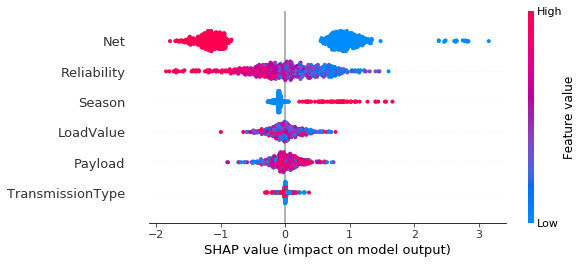

In [81]:
shap.summary_plot(dt_shap_values, x_test1)

**We could see the columns Payload and Season are most influencing**

In [84]:
# plot the SHAP values for force plot 
shap.force_plot(explainer1.expected_value,dt_shap_values[10,:], x_test.iloc[10,:])

**We could see the columns Reliability,Season and Net are most influencing**

In [86]:
shap.force_plot(explainer1.expected_value, dt_shap_values, x_test1)

**We could see the columns Net,Reliability and Season are most influencing**

### 13. Decision Tree after Model Explainablity     <a id = 'dtame'>

In [88]:
# Keeping the most influence columns and splitting
x2 = fuel[['Net','Season','Reliability']]
x2_train,x2_test,y_train,y_test = train_test_split(x2,y,test_size=0.25,random_state=2)

In [92]:
# Fitting the Decision Tree model after Model Explainability
dtme = DecisionTreeRegressor()
dtme.fit(x2_train,y_train)
dtme_pred = dtme.predict(x2_test)

In [93]:
# RMSE score for Decision Tree after Model Explainability
dtme_rmse = np.sqrt(metrics.mean_squared_error(dtme_pred,y_test))
dtme_rmse

1.073789443081024

In [94]:
# R2 score  for Decision Tree after Model Explainability
dtme_r2score = metrics.r2_score(dtme_pred,y_test)
dtme_r2score

0.6674798505608597

In [95]:
# Train score for Decision Tree after Model Explainability
dtme_train = dtme.score(x2_train,y_train)
dtme_train

0.9997379673155007

In [96]:
# Test score for Decision Tree after Model Explainability
dtme_test = dtme.score(x2_test,y_test)
dtme_test

0.659134010912771

### 14. Random Forest before Model Explainability     <a id = 'rfbme'>

In [98]:
# Importing the Random Forest model and fitting
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(x_train,y_train)
rf_pred = rf.predict(x_test)

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.


In [99]:
# RMSE score for Random Forest
rf_rmse = np.sqrt(metrics.mean_squared_error(rf_pred,y_test))
rf_rmse

0.8038641902835039

In [100]:
# R2 score for Random Forest
rf_r2score = metrics.r2_score(rf_pred,y_test)
rf_r2score

0.7901843924354487

In [101]:
# Train score for Random Forest
rf_train = rf.score(x_train,y_train)
rf_train

0.9655630411268455

In [102]:
# Test score for Random Forest
rf_test = rf.score(x_test,y_test)
rf_test

0.8089659531889355

### 15. Model Explainability for Random Forest     <a id = 'rfme'>

### 15.1 ELI5     <a id = 'elrf'>

In [103]:
# Import Eli5 package
import eli5
from eli5.sklearn import PermutationImportance

# Find the importance of columns for prediction
perm = PermutationImportance(rf, random_state=1).fit(x_test,rf_pred)
eli5.show_weights(perm, feature_names = x_test.columns.tolist())

Weight,Feature
0.8824 ± 0.0550,Net
0.2043 ± 0.0073,Reliability
0.0920 ± 0.0100,Season
0.0505 ± 0.0031,Payload
0.0452 ± 0.0029,LoadValue
0.0047 ± 0.0007,TransmissionType


**We could see the columns Net,Reliability,Season and Payload are most influencing**

In [104]:
ind = 4
#Understanding how each feature influences the prediction
eli5.explain_prediction(rf,x_test.iloc[30])

Explanation(estimator="RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,\n                      max_features='auto', max_leaf_nodes=None,\n                      min_impurity_decrease=0.0, min_impurity_split=None,\n                      min_samples_leaf=1, min_samples_split=2,\n                      min_weight_fraction_leaf=0.0, n_estimators=10,\n                      n_jobs=None, oob_score=False, random_state=None,\n                      verbose=0, warm_start=False)", description='\nFeatures with largest coefficients.\n\nFeature weights are calculated by following decision paths in trees\nof an ensemble (or a single tree for DecisionTreeClassifier).\nEach node of the tree has an output score, and contribution of a feature\non the decision path is how much the score changes from parent to child.\nWeights of all features sum to the output score or proba of the estimator.\n\nCaveats:\n1. Feature weights just show if the feature contributed positively or\n   negatively to the final score, and does not show how increasing or\n   decreasing the feature value will change the prediction.\n2. In some cases, feature weight can be close to zero for an important feature.\n   For example, in a single tree that computes XOR function, the feature at the\n   top of the tree will have zero weight because expected scores for both\n   branches are equal, so decision at the top feature does not change the\n   expected score. For an ensemble predicting XOR functions it might not be\n   a problem, but it is not reliable if most trees happen to choose the same\n   feature at the top.\n', error=None, method='decision path', is_regression=True, targets=[TargetExplanation(target='y', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=16.543958631595753, std=None, value=1.0), FeatureWeight(feature='Net', weight=1.221480977745506, std=None, value=2.0), FeatureWeight(feature='Payload', weight=0.11417571794213509, std=None, value=256.3497170996445)], neg=[FeatureWeight(feature='Season', weight=-0.4590254808203955, std=None, value=0.0), FeatureWeight(feature='Reliability', weight=-0.1526802580169548, std=None, value=70.53726673788535), FeatureWeight(feature='LoadValue', weight=-0.08083143696899278, std=None, value=889.7879850266589), FeatureWeight(feature='TransmissionType', weight=-0.010226615099774607, std=None, value=0.0)], pos_remaining=0, neg_remaining=0), proba=None, score=17.17685153637728, weighted_spans=None, heatmap=None)], feature_importances=None, decision_tree=None, highlight_spaces=None, transition_features=None, image=None)

**The columns Net and Payload are influencing**

### 15.2 LIME    <a id = 'lirf'>

In [105]:
# Import lime package
import lime
import lime.lime_tabular

#Find caegorical features
categorical_features = np.argwhere(np.array([len(set(x_test.values[:,x])) for x in range(x_test.values.shape[1])]) <= 10).flatten()
#Lime explainer for regression
explainer = lime.lime_tabular.LimeTabularExplainer(x_test.values,
                    feature_names=x_test.columns.values.tolist(),
                    class_names=['PriceCrore'],
                    categorical_features=categorical_features,
                    verbose=True, mode='regression')

ind = 4
#Fit on test data
exp = explainer.explain_instance(x_test.values[ind],rf.predict, num_features=6)

#Show in notebook features influencing predictions
exp.show_in_notebook(show_table=True)

Intercept 18.263333158038087
Prediction_local [14.38464282]
Right: 13.851407751410681


**We could see the columns Payload and Trannsmission Type are most influencing columns**

### 15.3 SHAP    <a id = 'shrf'>

In [107]:
# Importing Shap and creating explainer
import shap
rf_explainer=shap.TreeExplainer(rf)
rf_shap_values = rf_explainer.shap_values(x_test)

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


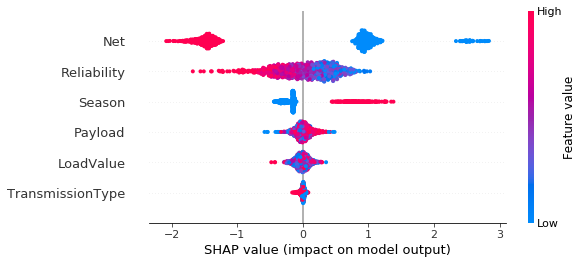

In [108]:
shap.summary_plot(rf_shap_values, x_test)

**We could see the columns Season,Payload are most influencing**

In [109]:
# plot the SHAP values for force plot 
shap.force_plot(rf_explainer.expected_value,rf_shap_values[10,:], x_test.iloc[10,:])

**We could see the columns Payload and LoadValue**

In [110]:
shap.force_plot(rf_explainer.expected_value,rf_shap_values, x_test)

**We could see the columns Net,Reliability and Season are most influencing columns**

### 16. Random Forest after Model Explainability     <a id = 'rfame'>

In [113]:
# Keeping the most influence columns and splitting
x4 = fuel[['Payload','Net','Reliability','Season']]
x4_train,x4_test,y_train,y_test = train_test_split(x4,y,test_size=0.25,random_state=2)

In [114]:
# Fitting the model
rfme = RandomForestRegressor()
rfme.fit(x4_train,y_train)
rfme_pred = rfme.predict(x4_test)

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.


In [115]:
# RMSE score for Random Forest after Model Explainability
rfme_rmse = np.sqrt(metrics.mean_squared_error(rfme_pred,y_test))
rfme_rmse

0.836572442131112

In [116]:
# R2 score for Random Forest after Model Explainability
rfme_r2score = metrics.r2_score(rfme_pred,y_test)
rfme_r2score

0.7763187783259817

In [117]:
# Train score for Random Forest after Model Explainability
rfme_train = rfme.score(x4_train,y_train)
rfme_train

0.9640786654825717

In [118]:
# Test score for Random Forest after Model Explainability
rfme_test = rfme.score(x4_test,y_test)
rfme_test

0.7931037977063535

### 17. Support Vector Machine before Model Explainability    <a id = 'svbme'>

In [119]:
# Importing Support Vector Machine and fitting the model
from sklearn.svm import SVR
svm = SVR()
svm.fit(x_train,y_train)
svm_pred = svm.predict(x_test)

The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.


In [120]:
# RMSE for SVM
svm_rmse = np.sqrt(metrics.mean_squared_error(svm_pred,y_test))
svm_rmse

1.7316103619138181

In [121]:
# R2 score for SVM
svm_r2score = metrics.r2_score(svm_pred,y_test)
svm_r2score

-29.282295870370604

In [122]:
# Train score for SVM
svm_train = svm.score(x_train,y_train)
svm_train

0.6650162537374991

In [123]:
# Test score for SVM
svm_test = svm.score(x_test,y_test)
svm_test

0.1135673123871278

### 18. Model Explainability for Support Vector Machine    <a id = 'svme'>

### 18.1 ELI5    <a id = 'elsv'>

In [124]:
# Import Eli5 package
import eli5
from eli5.sklearn import PermutationImportance

# Find the importance of columns for prediction
perm = PermutationImportance(svm, random_state=1).fit(x_test,svm_pred)
eli5.show_weights(perm, feature_names = x_test.columns.tolist())

Weight,Feature
1.2837 ± 0.0776,LoadValue
1.1776 ± 0.0846,Reliability
1.0222 ± 0.0523,Payload
0.0275 ± 0.0054,Net
0.0115 ± 0.0022,TransmissionType
0.0062 ± 0.0007,Season


**We could see almost all the columns influence the model**

### 18.2 LIME    <a id = 'lisv'>

In [125]:
# Import lime package
import lime
import lime.lime_tabular

#Find caegorical features
categorical_features = np.argwhere(np.array([len(set(x_test.values[:,x])) for x in range(x_test.values.shape[1])]) <= 10).flatten()
#Lime explainer for regression
explainer = lime.lime_tabular.LimeTabularExplainer(x_test.values,
                    feature_names=x_test.columns.values.tolist(),
                    class_names=['PriceCrore'],
                    categorical_features=categorical_features,
                    verbose=True, mode='regression')

ind = 4
#Fit on test data
exp = explainer.explain_instance(x_test.values[ind],svm.predict, num_features=6)

#Show in notebook features influencing predictions
exp.show_in_notebook(show_table=True)

Intercept 16.514855985164484
Prediction_local [16.29887285]
Right: 16.422684738716537


**We could see the column Payload influences more**

### 18.3 SHAP    <a id = 'shsv'>

In [133]:
# Sampling the data for SVM explainer as it will be very much slow for higher data shape
x_test3 = x_test.sample(frac=0.12)
x_test3.shape

(135, 6)

In [134]:
# Using shap to create explainer
svm_explainer = shap.KernelExplainer(svm.predict,x_test3)
svm_shap_values = svm_explainer.shap_values(x_test3)

Using 135 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_

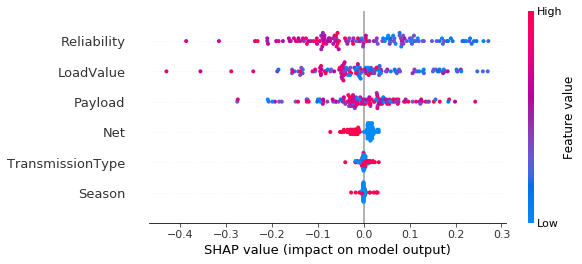

In [137]:
shap.summary_plot(svm_shap_values, x_test3)

**We could see the columns Reliability,LoadValue and Payload are most influencing**

In [138]:
# plot the SHAP values for force plot 
shap.force_plot(svm_explainer.expected_value,svm_shap_values[10,:], x_test.iloc[10,:])

**LoadValue and Net are more influencing**

In [139]:
shap.force_plot(svm_explainer.expected_value, svm_shap_values, x_test)

**We could see the columns Reliability,LoadValue and Payload are most influencing**

### 19. Support Vector Machines after Model Explainability    <a id = 'svame'>

In [140]:
# Keeping the most influence column and splliting the data
x3 = fuel[['Reliability','Payload','LoadValue']]
x3_train,x3_test,y_train,y_test = train_test_split(x3,y,test_size=0.25,random_state=2)

In [141]:
# Fitting the model
svmme = SVR()
svmme.fit(x3_train,y_train)
svmme_pred = svmme.predict(x3_test)

The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.


In [142]:
# RMSE score for Support Vector Machine after Model Explainability
svmme_rmse = np.sqrt(metrics.mean_squared_error(svmme_pred,y_test))
svmme_rmse

1.795193651955739

In [143]:
# R2 score for Support Vector Machine after Model Explainability
svmme_r2score = metrics.r2_score(svmme_pred,y_test)
svmme_r2score

-80.31266094624134

In [146]:
# Train score for Support Vector Machine after Model Explainability
svmme_train = svmme.score(x3_train,y_train)
svmme_train

0.6392320286480468

In [147]:
# Test score for Support Vector Machine after Model Explainability
svmme_test = svmme.score(x3_test,y_test)
svmme_test

0.04727399788979758

### 20. KNearest Neighbors before KNearest Neighbors   <a id = 'knnbme'>

In [149]:
# Importing KNN and fitting the model
from sklearn.neighbors import KNeighborsRegressor
knn = KNeighborsRegressor()
knn.fit(x_train,y_train)
knn_pred = knn.predict(x_test)

In [150]:
# RMSE score for KNearest Neighbors
knn_rmse = np.sqrt(metrics.mean_squared_error(knn_pred,y_test))
knn_rmse

1.2567924781144897

In [151]:
# R2 score for KNearest Neighbors
knn_r2score = metrics.r2_score(knn_pred,y_test)
knn_r2score

0.18820733937518175

In [152]:
# Train score for KNearest Neighbors
knn_train = knn.score(x_train,y_train)
knn_train

0.7003942788675213

In [153]:
# Test score for KNearest Neighbors
knn_test = knn.score(x_test,y_test)
knn_test

0.5330476599203882

### 21. Model Explainability for KNN    <a id = 'knnme'>

### 21.1 ELI5   <a id = 'elknn'>

In [154]:
# Import Eli5 package
import eli5
from eli5.sklearn import PermutationImportance

# Find the importance of columns for prediction
perm = PermutationImportance(knn, random_state=1).fit(x_test,knn_pred)
eli5.show_weights(perm, feature_names = x_test.columns.tolist())

Weight,Feature
0.8727 ± 0.0478,Reliability
0.8271 ± 0.0938,LoadValue
0.2372 ± 0.0173,Payload
0.0055 ± 0.0013,Net
0.0029 ± 0.0007,TransmissionType
0.0006 ± 0.0006,Season


**We could see the columns Reliability,LoadValue and Payload are most influencing**

### 21.2 LIME   <a id = 'liknn'>

In [156]:
# Import lime package
import lime
import lime.lime_tabular

#Find caegorical features
categorical_features = np.argwhere(np.array([len(set(x_test.values[:,x])) for x in range(x_test.values.shape[1])]) <= 10).flatten()
#Lime explainer for regression
explainer = lime.lime_tabular.LimeTabularExplainer(x_test.values,
                    feature_names=x_test.columns.values.tolist(),
                    class_names=['PriceCrore'],
                    categorical_features=categorical_features,
                    verbose=True, mode='regression')

ind = 4
#Fit on test data
exp = explainer.explain_instance(x_test.values[ind],knn.predict, num_features=6)

#Show in notebook features influencing predictions
exp.show_in_notebook(show_table=True)

Intercept 17.02895974918974
Prediction_local [14.30511754]
Right: 13.943284625840443


**Mostly all are giving negative influence only**

### 21.3 SHAP   <a id = 'shknn'>

In [171]:
# Sampling down as the kernel becomes really slow
x_test4 = x_test.sample(frac=0.05)
x_test4.shape

(56, 6)

In [172]:
# Using shap to create explainer
knn_explainer = shap.KernelExplainer(knn.predict,x_test4)
knn_shap_values = svm_explainer.shap_values(x_test4)

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_

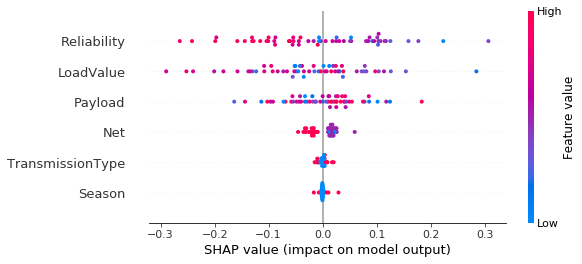

In [173]:
shap.summary_plot(knn_shap_values, x_test4)

**We could see the columns Reliability,LoadValue and Payload are most influencing**

In [174]:
# plot the SHAP values for force plot 
shap.force_plot(knn_explainer.expected_value,knn_shap_values[10,:], x_test.iloc[10,:])

**We could see the columns Payload and Reliability most influencing**

In [175]:
shap.force_plot(knn_explainer.expected_value, knn_shap_values, x_test)

**We could see the columns Reliability and LoadValue are influencing**

### 22. KNearest Neighbors after Model Explainability   <a id = 'knname'>

In [178]:
# Keeping the most influencing columns and splliting the data
x5 = fuel[['Reliability','LoadValue','Payload']]
x5_train,x5_test,y_train,y_test = train_test_split(x5,y,test_size=0.25,random_state=2)

In [180]:
# Fitting the model
knnme = KNeighborsRegressor()
knnme.fit(x5_train,y_train)
knnme_pred = knnme.predict(x5_test)

In [181]:
# RMSE score for KNearest Neighbors after Model Explainability
knnme_rmse = np.sqrt(metrics.mean_squared_error(knnme_pred,y_test))
knnme_rmse

1.267522586592789

In [182]:
# R2 score for KNearest Neighbors after Model Explainability
knnme_r2score = metrics.r2_score(knnme_pred,y_test)
knnme_r2score

0.17347894637316785

In [184]:
# Train score for KNearest Neighbors after Model Explainability
knnme_train = knnme.score(x5_train,y_train)
knnme_train

0.6944354017272747

In [185]:
# Test score for KNearest Neighbors after Model Explainability
knnme_test = knnme.score(x5_test,y_test)
knnme_test

0.5250402311842297

### 23. XG Boost before Model Explainability   <a id = 'xgbme'>

In [193]:
# Importing the model and fitting
from  xgboost import XGBRegressor
xgb = XGBRegressor()
xgb.fit(x_train,y_train)
xgb_pred = xgb.predict(x_test)

[20:56:16] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [194]:
# RMSE score for XG Boost
xgb_rmse = np.sqrt(metrics.mean_squared_error(xgb_pred,y_test))
xgb_rmse

0.7372354578869492

In [195]:
# R2 score for XG Boost
xgb_r2score = metrics.r2_score(xgb_pred,y_test)
xgb_r2score

0.8097264008109623

In [267]:
# Train score for XG Boost
xgb_train = xgb.score(x_train,y_train)
xgb_train

0.8520675251046643

In [268]:
# Test score for XG Boost
xgb_test = xgb.score(x_test,y_test)
xgb_test

0.839321473604068

### 24. Model Explainability for XG Boost   <a id = 'xgme'>

In [196]:
import xgboost as xgb1
xgb_model = xgb1.train({'objective':'reg:linear'}, xgb1.DMatrix(x_train, label=y_train))

[20:56:22] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


### 24.1 ELI5   <a id = 'elxg'>

In [197]:
# Import Eli5 package
import eli5
from eli5.sklearn import PermutationImportance

# Find the importance of columns for prediction
perm = PermutationImportance(xgb, random_state=1).fit(x_test,xgb_pred)
eli5.show_weights(perm, feature_names = x_test.columns.tolist())

Weight,Feature
0.8896 ± 0.0523,Net
0.2025 ± 0.0083,Reliability
0.0552 ± 0.0052,Season
0.0044 ± 0.0005,LoadValue
0.0043 ± 0.0004,Payload
0.0000 ± 0.0000,TransmissionType


**We could see the columns Net,Reliability and Season are the most influencing columns**

In [198]:
ind = 4
#Understanding how each feature influences the prediction
eli5.explain_prediction(xgb,x_test.iloc[30])

Explanation(estimator="XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,\n             colsample_bynode=1, colsample_bytree=1, gamma=0,\n             importance_type='gain', learning_rate=0.1, max_delta_step=0,\n             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,\n             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,\n             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,\n             silent=None, subsample=1, verbosity=1)", description='\nFeatures with largest coefficients.\n\nFeature weights are calculated by following decision paths in trees\nof an ensemble. Each leaf has an output score, and expected scores can also be\nassigned to parent nodes. Contribution of one feature on the decision path\nis how much expected score changes from parent to child. Weights of all \nfeatures sum to the output score of the estimator.\n\nCaveats:\n1. Feature weights just show if the feature contributed positively or\n   negatively to the final score, and does not show how increasing or\n   decreasing the feature value will change the prediction.\n2. In some cases, feature weight can be close to zero for an important feature.\n   For example, in a single tree that computes XOR function, the feature at the\n   top of the tree will have zero weight because expected scores for both\n   branches are equal, so decision at the top feature does not change the\n   expected score. For an ensemble predicting XOR functions it might not be\n   a problem, but it is not reliable if most trees happen to choose the same\n   feature at the top.\n', error=None, method='decision paths', is_regression=True, targets=[TargetExplanation(target='y', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=16.047568408071427, std=None, value=1.0), FeatureWeight(feature='Net', weight=1.1358376512233819, std=None, value=2.0)], neg=[FeatureWeight(feature='Season', weight=-0.2812971709891398, std=None, value=0.0), FeatureWeight(feature='Reliability', weight=-0.258499090161654, std=None, value=70.53726673788535), FeatureWeight(feature='Payload', weight=-0.048113449347620345, std=None, value=256.3497170996445), FeatureWeight(feature='LoadValue', weight=-0.012909144842836024, std=None, value=889.7879850266589)], pos_remaining=0, neg_remaining=0), proba=None, score=16.582587203953565, weighted_spans=None, heatmap=None)], feature_importances=None, decision_tree=None, highlight_spaces=None, transition_features=None, image=None)

**The Net column in most influencing**

### 24.2 SHAP   <a id = 'shxg'>

In [199]:
# Using SHAP explainer
xgb_explainer = shap.TreeExplainer(xgb_model)
xgb_shap_values = xgb_explainer.shap_values(x_test3)

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


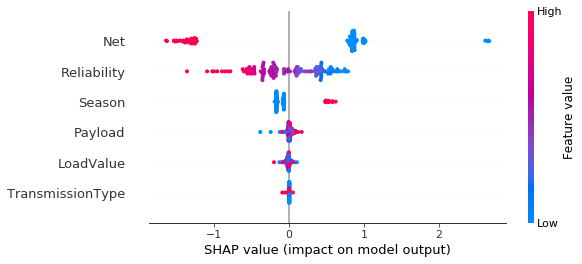

In [200]:
shap.summary_plot(xgb_shap_values, x_test3)

**The columns Reliability Season are influencing**

In [201]:
# plot the SHAP values for force plot 
shap.force_plot(xgb_explainer.expected_value,xgb_shap_values[10,:], x_test.iloc[10,:])

**The column Net is influencing**

In [202]:
# plot the SHAP values for force plot
shap.force_plot(xgb_explainer.expected_value, xgb_shap_values, x_test)

**Again the Net column is the most influencing one**

### 25. XG Boost after Model Explainability   <a id = 'xgame'>

In [204]:
# Keeping the most influencing columns and splliting the dataset
x6 = fuel[['Net','Reliability']]
x6_train,x6_test,y_train,y_test = train_test_split(x6,y,test_size=0.25,random_state=2)

In [262]:
# Fitting the model
xgbme = XGBRegressor()
xgbme.fit(x6_train,y_train)
xgme_pred = xgbme.predict(x6_test)

[21:13:28] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [270]:
# RMSE score for XG Boost after Model Explainability
xgbme_rmse = np.sqrt(metrics.mean_squared_error(xgme_pred,y_test))
xgbme_rmse

0.7646704149268959

In [264]:
# R2 score for XG Boost after Model Explainability
xgbme_r2score = metrics.r2_score(xgme_pred,y_test)
xgbme_r2score

0.793550199969971

In [265]:
# Train score for XG Boost after Model Explainability
xgbme_train = xgbme.score(x6_train,y_train)
xgbme_train

0.8377297717924678

In [266]:
# Test score for XG Boost after Model Explainability
xgbme_test = xgbme.score(x6_test,y_test)
xgbme_test

0.8271402080629566

### 26. Ada Boost before Model Explainability   <a id = 'adabme'>

In [237]:
# Importing Ada Boost and fitting the model
from sklearn.ensemble import AdaBoostRegressor
ada = AdaBoostRegressor()
ada.fit(x_train,y_train)
ada_pred = ada.predict(x_test)

In [238]:
# RMSE score for Ada Boost
ada_rmse = np.sqrt(metrics.mean_squared_error(ada_pred,y_test))
ada_rmse

0.7549908085217045

In [239]:
# R2 score for Ada Boost
ada_r2score = metrics.r2_score(ada_pred,y_test)
ada_r2score

0.8181932202973521

In [240]:
# Train score for Ada Boost
ada_train = ada.score(x_train,y_train)
ada_train

0.8297157061212768

In [241]:
# Test score for Ada Boost
ada_test = ada.score(x_test,y_test)
ada_test

0.831488812360774

### 27. Model Explainability for Ada Boost   <a id = 'adame'>

### 27.1 ELI5   <a id = 'elada'>

In [216]:
# Import Eli5 package
import eli5
from eli5.sklearn import PermutationImportance

# Find the importance of columns for prediction
perm = PermutationImportance(ada, random_state=1).fit(x_test,ada_pred)
eli5.show_weights(perm, feature_names = x_test.columns.tolist())

Weight,Feature
1.1561 ± 0.0643,Net
0.0942 ± 0.0047,Reliability
0.0723 ± 0.0062,Season
0.0011 ± 0.0002,Payload
0.0004 ± 0.0001,LoadValue
0.0000 ± 0.0000,TransmissionType


**The columns Net and Reliability are most influencing**

### 27.2 LIME   <a id = 'liada'>

In [218]:
# Import lime package
import lime
import lime.lime_tabular

#Find caegorical features
categorical_features = np.argwhere(np.array([len(set(x_test.values[:,x])) for x in range(x_test.values.shape[1])]) <= 10).flatten()
#Lime explainer for regression
explainer = lime.lime_tabular.LimeTabularExplainer(x_test.values,
                    feature_names=x_test.columns.values.tolist(), mode='regression')

ind = 4
#Fit on test data
exp = explainer.explain_instance(x_test.values[ind],ada.predict, num_features=6)

#Show in notebook features influencing predictions
exp.show_in_notebook(show_table=True)

**We could see Transmission Type column has a bit positive influence**

### 27.3 SHAP   <a id = 'shada'>

In [219]:
# Using SHAP explainer
ada_explainer = shap.KernelExplainer(ada.predict,x_test3)
ada_shap_values = ada_explainer.shap_values(x_test3)

Using 135 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_

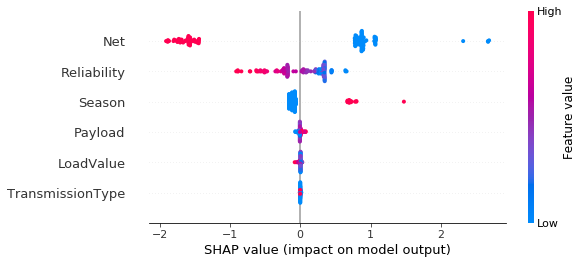

In [220]:
shap.summary_plot(ada_shap_values, x_test3)

**We could see the columns Reliability and Season are influencing**

In [221]:
# plot the SHAP values for force plot 
shap.force_plot(ada_explainer.expected_value,ada_shap_values[10,:], x_test.iloc[10,:])

**The column Net is influencing**

In [222]:
# plot the SHAP values for force plot
shap.force_plot(ada_explainer.expected_value, ada_shap_values, x_test)

**The columns Net and Season are influencing**

### 28. Ada Boost after Model Explainability   <a id = 'adaame'>

In [224]:
# Keeping the most influenced column and splitting the dataset
x7 = fuel[['Net','Season']]
x7_train,x7_test,y_train,y_test = train_test_split(x7,y,test_size=0.25,random_state=2)

In [226]:
# Fitting the model
adame = AdaBoostRegressor()
adame.fit(x7_train,y_train)
adame_pred = adame.predict(x7_test)

In [233]:
# RMSE score  for Ada Boost after Model Explainability
adame_rmse = np.sqrt(metrics.mean_squared_error(adame_pred,y_test))
adame_rmse

0.8738800158960001

In [234]:
# R2 score for Ada Boost after Model Explainability
adame_r2score = metrics.r2_score(adame_pred,y_test)
adame_r2score

0.7559603553879921

In [235]:
# Train score for Ada Boost after Model Explainability
adame_train = adame.score(x7_train,y_train)
adame_train

0.7755869408521878

In [236]:
# Test score for Ada Boost after Model Explainability
adame_test = adame.score(x7_train,y_train)
adame_test

0.7755869408521878

### 29. Gradient Boosting before Model Explainability   <a id = 'gradbme'>

In [242]:
# Importing Gradient Boosting and fiting the model
from sklearn.ensemble import GradientBoostingRegressor
gb = GradientBoostingRegressor()
gb.fit(x_train,y_train)
gb_pred = gb.predict(x_test)

In [243]:
# RMSE score for Gradient Boosting
gb_rmse = np.sqrt(metrics.mean_squared_error(gb_pred,y_test))
gb_rmse

0.7387477662942871

In [244]:
# R2 score for Gradient Boosting
gb_r2score = metrics.r2_score(gb_pred,y_test)
gb_r2score

0.8090522901810548

In [245]:
# Train score for Gradient Boosting
gb_train = gb.score(x_train,y_train)
gb_train

0.8540639577270662

In [246]:
# Test score for Gradient Boosting
gb_test = gb.score(x_test,y_test)
gb_test

0.8386615902115406

### 30. Model Explainability for Gradient Boosting   <a id = 'gradme'>

### 30.1 ELI5   <a id = 'elgrad'>

In [247]:
# Import Eli5 package
import eli5
from eli5.sklearn import PermutationImportance

# Find the importance of columns for prediction
perm = PermutationImportance(gb, random_state=1).fit(x_test,gb_pred)
eli5.show_weights(perm, feature_names = x_test.columns.tolist())

Weight,Feature
0.9475 ± 0.0565,Net
0.1670 ± 0.0087,Reliability
0.0600 ± 0.0067,Season
0.0052 ± 0.0005,Payload
0.0050 ± 0.0008,LoadValue
0.0000 ± 0.0000,TransmissionType


**We could see the columns Net and Reliability are most influencing**

In [248]:
ind = 4
#Understanding how each feature influences the prediction
eli5.explain_prediction(gb,x_test.iloc[30])

Explanation(estimator="GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,\n                          learning_rate=0.1, loss='ls', max_depth=3,\n                          max_features=None, max_leaf_nodes=None,\n                          min_impurity_decrease=0.0, min_impurity_split=None,\n                          min_samples_leaf=1, min_samples_split=2,\n                          min_weight_fraction_leaf=0.0, n_estimators=100,\n                          n_iter_no_change=None, presort='auto',\n                          random_state=None, subsample=1.0, tol=0.0001,\n                          validation_fraction=0.1, verbose=0, warm_start=False)", description='\nFeatures with largest coefficients.\n\nFeature weights are calculated by following decision paths in trees\nof an ensemble (or a single tree for DecisionTreeClassifier).\nEach node of the tree has an output score, and contribution of a feature\non the decision path is how much the score changes from parent to child.\nWeights of all features sum to the output score or proba of the estimator.\n\nCaveats:\n1. Feature weights just show if the feature contributed positively or\n   negatively to the final score, and does not show how increasing or\n   decreasing the feature value will change the prediction.\n2. In some cases, feature weight can be close to zero for an important feature.\n   For example, in a single tree that computes XOR function, the feature at the\n   top of the tree will have zero weight because expected scores for both\n   branches are equal, so decision at the top feature does not change the\n   expected score. For an ensemble predicting XOR functions it might not be\n   a problem, but it is not reliable if most trees happen to choose the same\n   feature at the top.\n', error=None, method='decision path', is_regression=True, targets=[TargetExplanation(target='y', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=16.548060902663916, std=None, value=1.0), FeatureWeight(feature='Net', weight=1.1541703849959932, std=None, value=2.0), FeatureWeight(feature='LoadValue', weight=0.00844986842214908, std=None, value=889.7879850266589)], neg=[FeatureWeight(feature='Season', weight=-0.3394570642864287, std=None, value=0.0), FeatureWeight(feature='Reliability', weight=-0.25827944198490804, std=None, value=70.53726673788535), FeatureWeight(feature='Payload', weight=-0.07291189368090405, std=None, value=256.3497170996445)], pos_remaining=0, neg_remaining=0), proba=None, score=17.04003275612983, weighted_spans=None, heatmap=None)], feature_importances=None, decision_tree=None, highlight_spaces=None, transition_features=None, image=None)

**We could see the columns Net and LoadValue are most influencing**

### 30.2 LIME   <a id = 'ligrad'>

In [249]:
# Import lime package
import lime
import lime.lime_tabular

#Find caegorical features
categorical_features = np.argwhere(np.array([len(set(x_test.values[:,x])) for x in range(x_test.values.shape[1])]) <= 10).flatten()
#Lime explainer for regression
explainer = lime.lime_tabular.LimeTabularExplainer(x_test.values,
                    feature_names=x_test.columns.values.tolist(), mode='regression')

ind = 4
#Fit on test data
exp = explainer.explain_instance(x_test.values[ind],gb.predict, num_features=6)

#Show in notebook features influencing predictions
exp.show_in_notebook(show_table=True)

**Transmission Type is the column which is influencing that too slightly in positive side**

### 30.3 SHAP   <a id = 'shgrad'>

In [250]:
# Using SHAP explainer
gb_explainer = shap.KernelExplainer(gb.predict,x_test3)
gb_shap_values = gb_explainer.shap_values(x_test3)

Using 135 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_

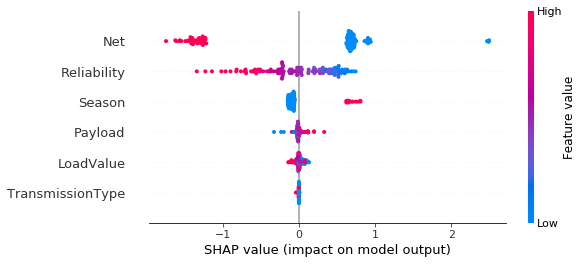

In [251]:
shap.summary_plot(gb_shap_values, x_test3)

**We could see the columns Reliability and Season are most influencing**

In [252]:
# plot the SHAP values for force plot 
shap.force_plot(gb_explainer.expected_value,gb_shap_values[10,:], x_test.iloc[10,:])

**The column Net is most influencing**

In [253]:
# plot the SHAP values for force plot
shap.force_plot(gb_explainer.expected_value,gb_shap_values, x_test)

**The columns Net,Reliability and Season are the columns influencing**

### 31. Gradient Boosting after Model Explainability   <a id = 'gradame'>

In [254]:
# Keeping the most influencing columns and splitting
x8 = fuel[['Net','Reliability','LoadValue']]
x8_train,x8_test,y_train,y_test = train_test_split(x8,y,test_size=0.25,random_state=2)

In [255]:
# Fitting the model
gbme = GradientBoostingRegressor()
gbme.fit(x8_train,y_train)
gbme_pred = gbme.predict(x8_test)

In [256]:
# RMSE score for Gradient Boosting after Model Explainability
gbme_rmse = np.sqrt(metrics.mean_squared_error(gbme_pred,y_test))
gbme_rmse

0.7655464002583534

In [257]:
# R2 score for Gradient Boosting after Model Explainability
gbme_r2score = metrics.r2_score(gbme_pred,y_test)
gbme_r2score

0.7919517346708793

In [259]:
# Train score for Gradient Boosting after Model Explainability
gbme_train = gbme.score(x8_train,y_train)
gbme_train

0.8451336565710696

In [260]:
# Test score for Gradient Boosting after Model Explainability
gbme_test = gbme.score(x8_test,y_test)
gbme_test

0.8267439343952987

### 32. Comparison Table   <a id = 'ct'>

In [273]:
# Creating dictionary for all the metrics and models
metrics = {'Metrics': ['Before Model Explainability Train score','Before Model Explainability Test score','After Model Explainability Train score','After Model Explainability Test score','Before Model Explainability RMSE score','After Model Explainability RMSE score','Before Model Explainability R2 score','After Model Explainability R2 score'],'Linear Regression':[lr_train,lr_test,lrme_train,lrme_test,lr_rmse,lrme_rmse,lr_r2score,lrme_r2score],
           'Decision Tree Regressor':[dt_train,dt_test,dtme_train,dtme_test,dt_rmse,dtme_rmse,dt_r2score,dtme_r2score],'Ramdom Forest Regressor':[rf_train,rf_test,rfme_train,rfme_test,rf_rmse,rfme_rmse,rf_r2score,rfme_r2score],'Support Vector Regressor':[svm_train,svm_test,svmme_train,svmme_test,svm_rmse,svmme_rmse,svm_r2score,svmme_r2score],
          'KNearestNeighbor Regressor':[knn_train,knn_test,knnme_train,knnme_test,knn_rmse,knnme_rmse,knn_r2score,knnme_r2score],
          'XG Boost Regressor':[xgb_train,xgb_test,xgbme_train,xgbme_test,xgb_rmse,xgbme_rmse,xgb_r2score,xgbme_r2score],
          'Ada Boost Regressor':[ada_train,ada_test,adame_train,adame_test,ada_rmse,adame_rmse,ada_r2score,adame_r2score],
          'Gradient Boosting Regressor':[gb_train,gb_test,gbme_train,gbme_test,gb_rmse,gbme_rmse,gb_r2score,gbme_r2score]}

In [274]:
# The Dataframe of the metrics
metrics = pd.DataFrame(metrics)
metrics

,Metrics,Linear Regression,Decision Tree Regressor,Ramdom Forest Regressor,Support Vector Regressor,KNearestNeighbor Regressor,XG Boost Regressor,Ada Boost Regressor,Gradient Boosting Regressor
0,Before Model Explainability Train score,0.833835,1.000000,0.965563,0.665016,0.700394,0.852068,0.829716,0.854064
1,Before Model Explainability Test score,0.836368,0.680375,0.808966,0.113567,0.533048,0.839321,0.831489,0.838662
2,After Model Explainability Train score,0.833323,0.999738,0.964079,0.639232,0.694435,0.837730,0.775587,0.845134
3,After Model Explainability Test score,0.835233,0.659134,0.793104,0.047274,0.525040,0.827140,0.775587,0.826744
4,Before Model Explainability RMSE score,0.743980,1.039794,0.803864,1.731610,1.256792,0.737235,0.754991,0.738748
5,After Model Explainability RMSE score,0.746557,1.073789,0.836572,1.795194,1.267523,0.764670,0.873880,0.765546
6,Before Model Explainability R2 score,0.806990,0.692515,0.790184,-29.282296,0.188207,0.809726,0.818193,0.809052
7,After Model Explainability R2 score,0.805557,0.667480,0.776319,-80.312661,0.173479,0.793550,0.755960,0.791952


**We could see that the models Linear Regression and Ada Boost Regressor are good models**